In [269]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [270]:
# from google.colab import files
# files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

In [271]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

The dataset contains 4 vectors ($F0-F3$), containing the fundamental frequencies ($F0$, $F1$, $F2$ and $F3$) for each phoneme and another vector “phoneme\_id” containing a number representing the id of the phoneme.


In [272]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

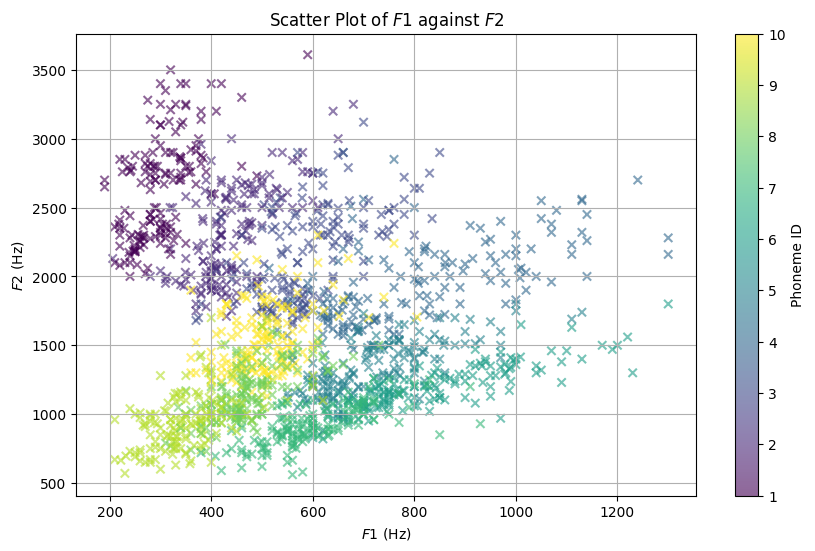

In [273]:
### your code here
import numpy as np

# Load the provided data file
#data_path = '/mnt/data/PB_data.npy'
#data = np.ndarray.tolist(data)

# Extract the required data from the loaded data
phoneme_id = np.array(data['phoneme_id'])
f1 = np.array(data['f1'])
f2 = np.array(data['f2'])

# Create a scatter plot of f1 against f2
plt.figure(figsize=(10, 6))
plt.scatter(f1, f2, c=phoneme_id, cmap='viridis', alpha=0.6, marker='x')
plt.xlabel('$F1$ (Hz)')
plt.ylabel('$F2$ (Hz)')
plt.title('Scatter Plot of $F1$ against $F2$')
plt.colorbar(label='Phoneme ID')
plt.grid(True)
plt.show()

# 1. MoG Using the EM algorithm

Recall the following definition of a Mixture of Gaussians. Assuming our observed random vector is $\mathbf{x}\in\mathbb{R}^D$, a MoG models $p(\mathbf{x})$ as a sum of $K$-many weighted Gaussians. More specifically:


\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$

denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
For the E step we softly assign each datum to the closest centroid (using the current iteration's fixed model parameters) as in the K means example.

For the M step we update the model parameters $\theta$ to maximize the weighted log-likelihood.
At a high level, for each centroid k we:
* Update the mean vectors
* Update the covariance matrices (We will fit Gaussians with diagonal covariance matrices)
* Set the mixture coefficients as the mean probability of a sample being generated by the k-th gaussian component

Read the code below and understand what it is calculating

In [274]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z


### Helper functions

In [275]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):

        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]

            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Train MoG

Read the following blocks of code and understand what it does.

In [276]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

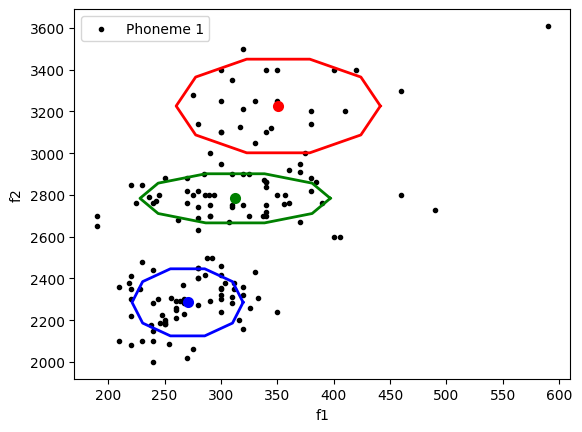


Finished.

[[ 350.8446  3226.3394 ]
 [ 312.59125 2783.898  ]
 [ 270.3952  2285.4653 ]] [[[ 4102.87537456     0.        ]
  [    0.         27829.54223973]]

 [[ 3562.59743769     0.        ]
  [    0.          7657.84896997]]

 [[ 1213.73843494     0.        ]
  [    0.         14278.42029989]]]
Implemented GMM | Mean values:
[[ 350.8446  3226.3394 ]
 [ 312.59125 2783.898  ]
 [ 270.3952  2285.4653 ]]
Implemented GMM | Covariances:
Covariance matrix for component 0:
[[ 4102.87537456     0.        ]
 [    0.         27829.54223973]]
Covariance matrix for component 1:
[[3562.59743769    0.        ]
 [   0.         7657.84896997]]
Covariance matrix for component 2:
[[ 1213.73843494     0.        ]
 [    0.         14278.42029989]]
Implemented GMM | Weights:
[0.18386038 0.38099528 0.43514434]


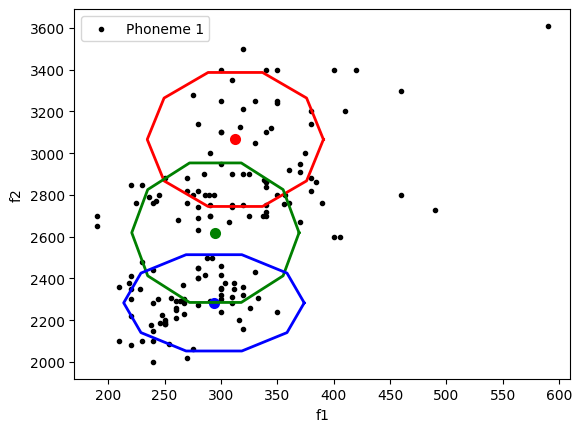

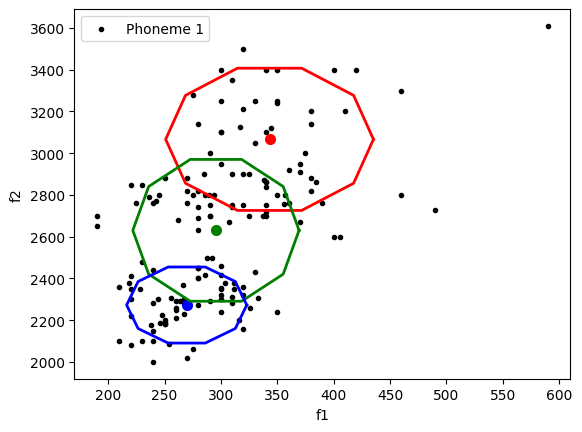

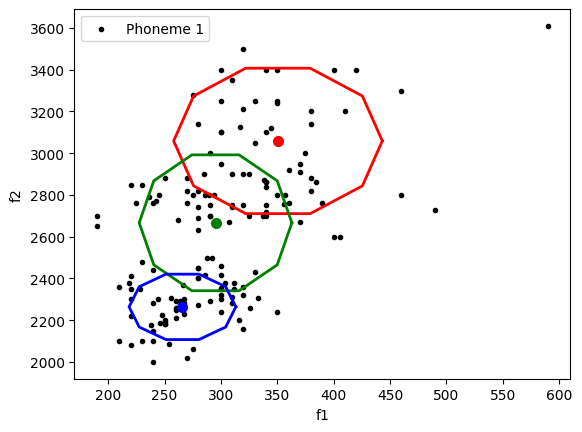

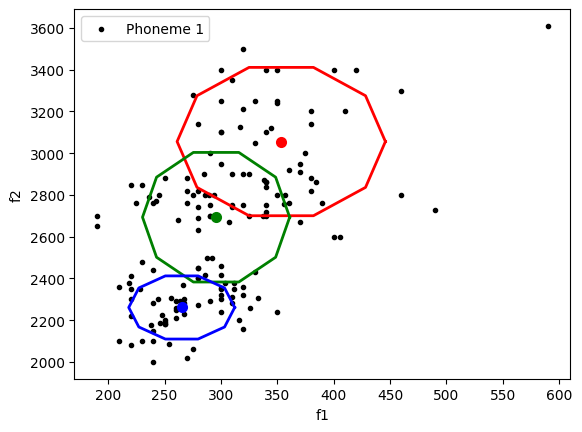

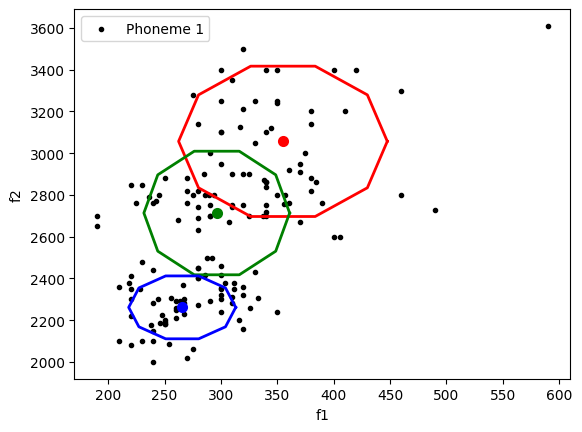

...

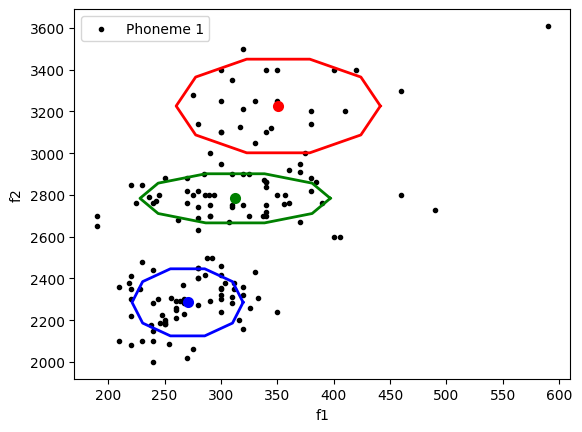

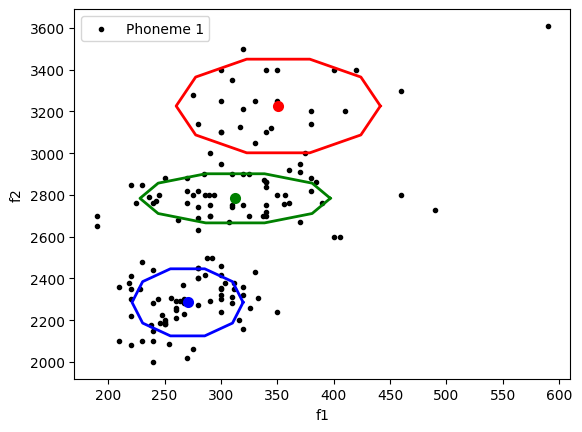

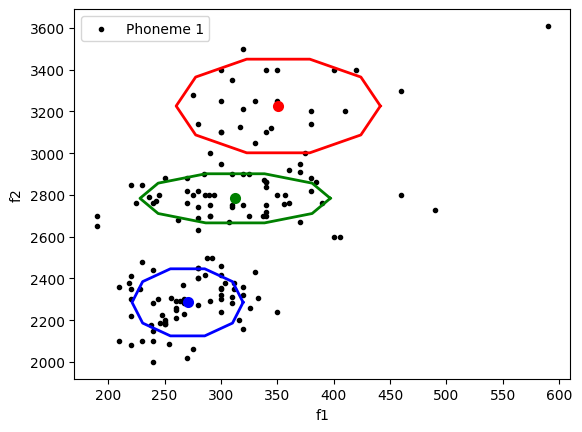

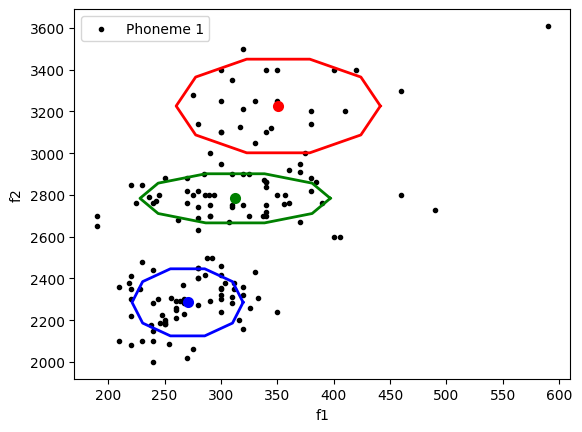

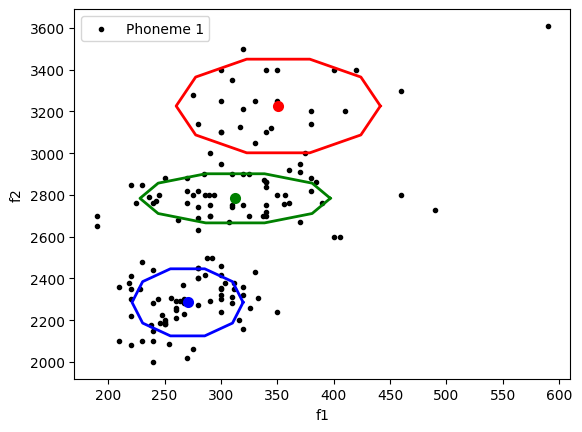

In [277]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)
print('Implemented GMM | Mean values:')
print(mu)

print('Implemented GMM | Covariances:')
for i in range(k):
    print('Covariance matrix for component {}:'.format(i))
    print(s[i,:,:])

print('Implemented GMM | Weights:')
print(p)

In [278]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import scipy.linalg
from zipfile import ZipFile

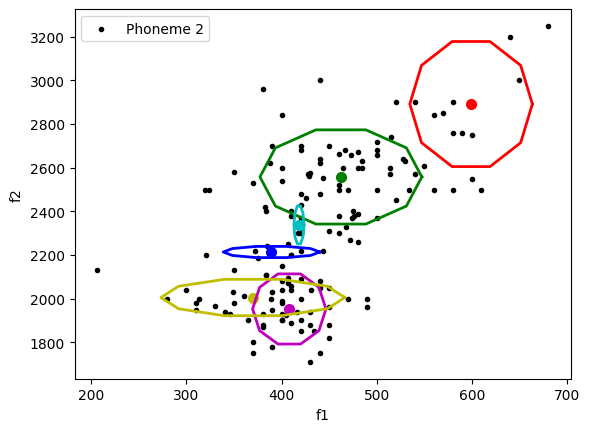


Finished.

[[ 599.1714  2891.9336 ]
 [ 462.3037  2557.7705 ]
 [ 389.35867 2213.789  ]
 [ 418.19528 2337.9985 ]
 [ 408.04333 1952.6538 ]
 [ 369.8009  2005.2    ]] [[[2.07554803e+03 0.00000000e+00]
  [0.00000000e+00 4.54176441e+04]]

 [[3.62043901e+03 0.00000000e+00]
  [0.00000000e+00 2.57546053e+04]]

 [[1.28689548e+03 0.00000000e+00]
  [0.00000000e+00 3.63927120e+02]]

 [[1.39275255e+01 0.00000000e+00]
  [0.00000000e+00 4.20050330e+03]]

 [[7.43005136e+02 0.00000000e+00]
  [0.00000000e+00 1.42800898e+04]]

 [[4.66970935e+03 0.00000000e+00]
  [0.00000000e+00 3.84788627e+03]]]
Implemented GMM | Mean values:
[[ 599.1714  2891.9336 ]
 [ 462.3037  2557.7705 ]
 [ 389.35867 2213.789  ]
 [ 418.19528 2337.9985 ]
 [ 408.04333 1952.6538 ]
 [ 369.8009  2005.2    ]]
Implemented GMM | Covariances:
Covariance matrix for component 0:
[[ 2075.54802563     0.        ]
 [    0.         45417.64405545]]
Covariance matrix for component 1:
[[ 3620.43901007     0.        ]
 [    0.         25754.60529088]]


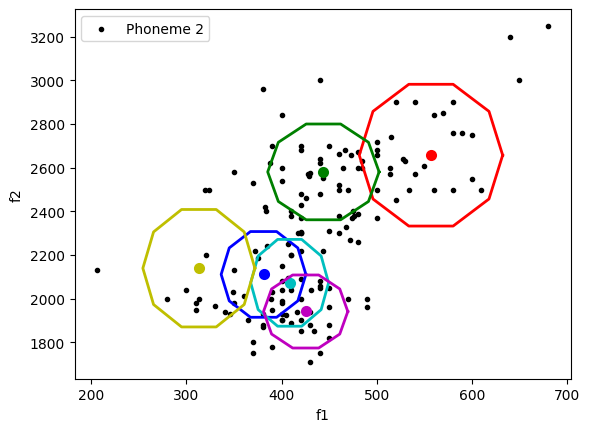

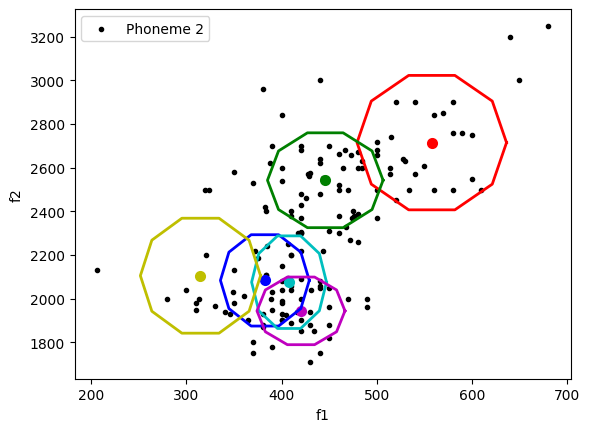

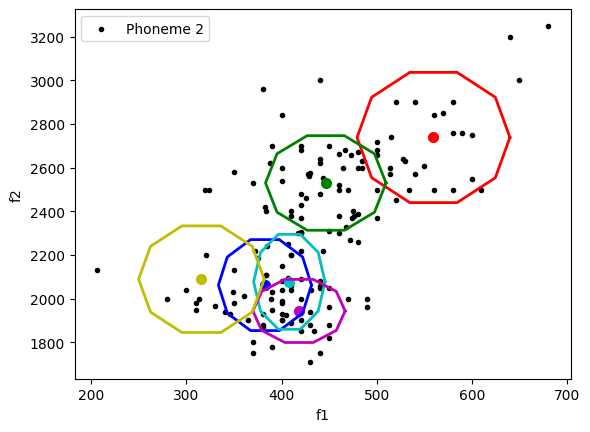

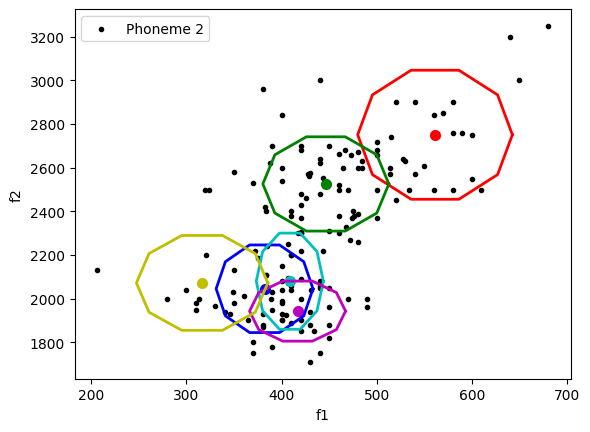

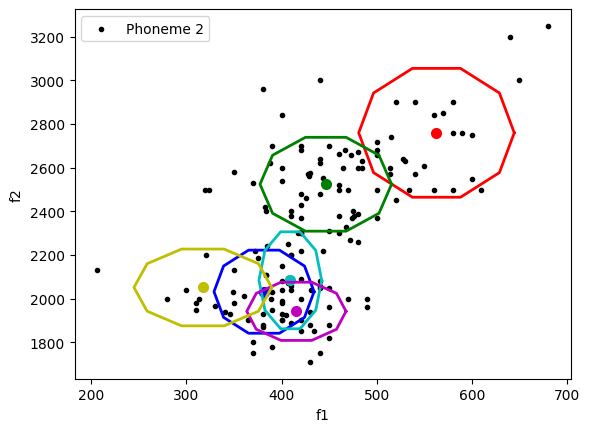

...

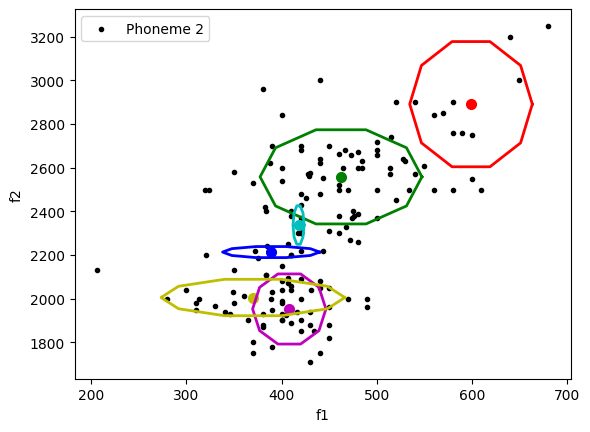

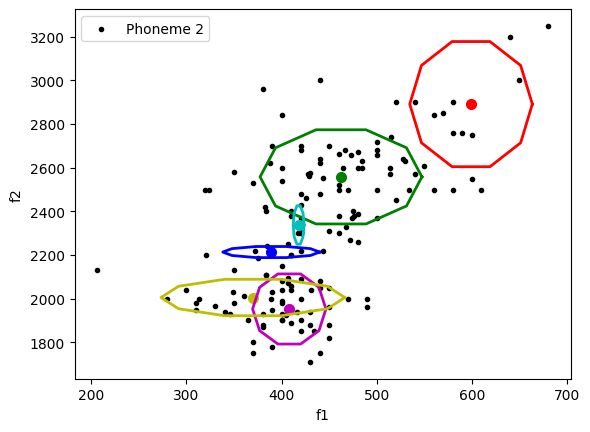

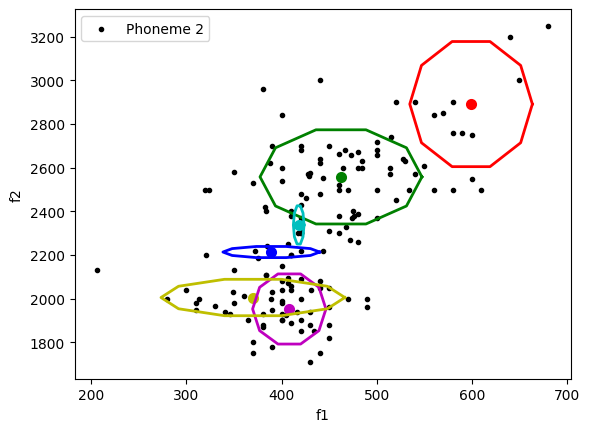

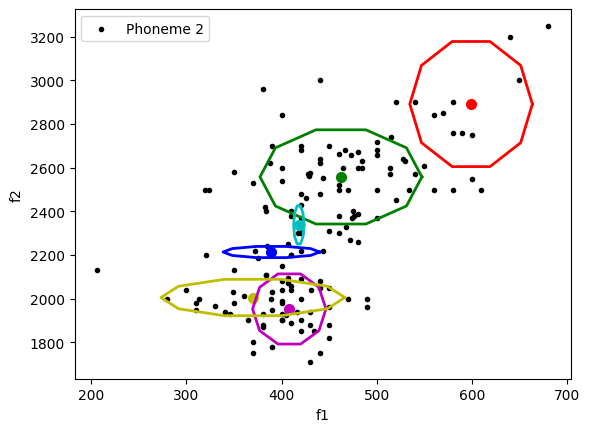

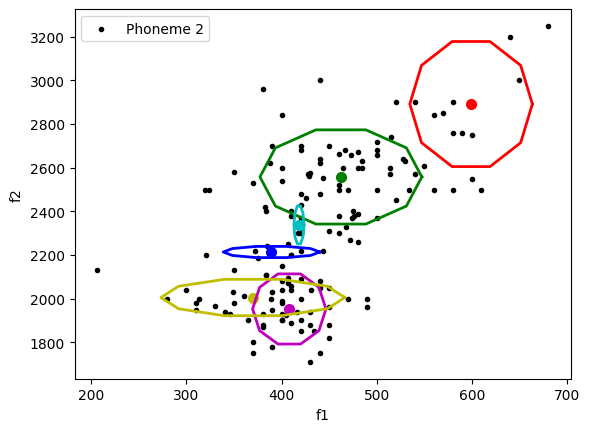

In [279]:
### your code here\
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)
print('Implemented GMM | Mean values:')
print(mu)

print('Implemented GMM | Covariances:')
for i in range(k):
    print('Covariance matrix for component {}:'.format(i))
    print(s[i,:,:])

print('Implemented GMM | Weights:')
print(p)



Classify using the Maximum Likelihood (ML) criterion and calculate the miss-classification error. Remember that a classification under the ML compares $p(\mathbf{x};\boldsymbol\theta_{1})$, where $\boldsymbol\theta_{1}$ are the parameters of the MoG learnt for the first phoneme, with $p(\mathbf{x};\boldsymbol\theta_{2})$, where $\boldsymbol\theta_{2}$  are the parameters of the MoG learnt for the second phoneme.

In [280]:
from scipy.stats import multivariate_normal


In [281]:
k = 3
inds_1 = np.where(phoneme_id==1)[0]
inds_2 = np.where(phoneme_id==2)[0]
# inds_1 = inds_1[0]
# inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk
for i in range(k):
    Z_phoneme_1[:, i] = p[i] * multivariate_normal.pdf(X, mean=mu[i], cov=s[i], allow_singular=True)
# get predictions
###your code here


# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
###your code here
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)  # Assuming you have saved parameters for phoneme 2
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
    mu_2 = GMM_parameters_phoneme_2['mu']
    s_2 = GMM_parameters_phoneme_2['s']
    p_2 = GMM_parameters_phoneme_2['p']
else:
    raise FileNotFoundError('File {} does not exist.'.format(npy_filename))
# mu = GMM_parameters_phoneme_1['mu']
# s = GMM_parameters_phoneme_1['s']
# p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N, k))
 # shape Nxk
for i in range(k):
    Z_phoneme_2[:, i] = p_2[i] * multivariate_normal.pdf(X, mean=mu_2[i], cov=s_2[i], allow_singular=True)
# classify each point using Maximum Likelihood

### your code here
# Perform classification using Maximum Likelihood criterion
# Compare likelihoods of samples for both phonemes using GMM predictions
# If log likelihood of phoneme 1 is higher, classify as phoneme 1; otherwise, classify as phoneme 2

# Calculate log likelihoods for both phonemes
log_likelihood_phoneme_1 = np.sum(np.log(np.sum(Z_phoneme_1, axis=1)))
log_likelihood_phoneme_2 = np.sum(np.log(np.sum(Z_phoneme_2, axis=1)))

# Make classification based on log likelihoods
classification = np.where(log_likelihood_phoneme_1 > log_likelihood_phoneme_2, 1, 2)

# Calculate miss-classification error
miss_classification = np.sum(phoneme_id[inds_1_and_2] != classification)
miss_classification_error = miss_classification / len(inds_1_and_2)

# calculate accuracy
### your code here
pred_1 = Z_phoneme_1.sum(axis=1)
pred_2 = Z_phoneme_2.sum(axis=1)
# preds = np.ones(len())
combined_preds = np.argmax(np.stack([pred_1, pred_2], axis = 1), axis=1) + 1
# calculate accuracy
### your code here
true_labels = phoneme_id[inds_1_and_2]
accuracy = np.mean(combined_preds == true_labels)
print(f'Accuracy: {accuracy * 100:.2f}%')


Accuracy: 95.07%


f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


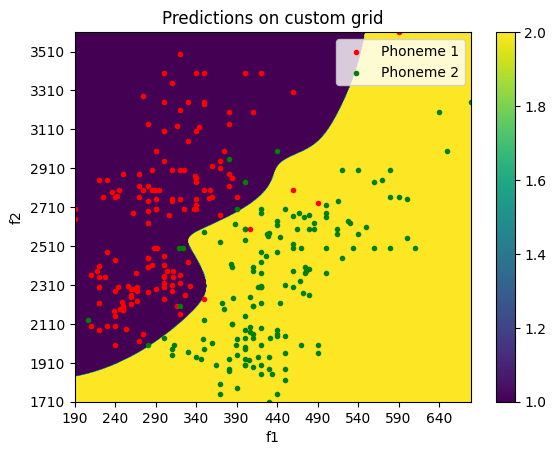

Accuracy: 95.07%


In [287]:
k = 3


X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
# Do predictions, using GMM trained on phoneme 2, on custom grid
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

ax_f1 = np.linspace(min_f1, max_f1, N_f1)
ax_f2 = np.linspace(min_f2, max_f2, N_f2)
x_axis, y_axis = np.meshgrid(ax_f1, ax_f2)
samples = np.stack((x_axis.flatten(), y_axis.flatten())).transpose()

# Phoneme model no. 1
p_id = 1
phoneme_model_1 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
params_1 = np.load(phoneme_model_1, allow_pickle=True)
params_1 = np.ndarray.tolist(params_1)
copy = samples.copy()
Z_1 = get_predictions(
    params_1['mu'],
    params_1['s'],
    params_1['p'],
    copy
)

# Phoneme model no. 2
p_id = 2
phoneme_model_2 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
params_2 = np.load(phoneme_model_2, allow_pickle=True)
params_2 = np.ndarray.tolist(params_2)
Z_2 = get_predictions(
    params_2['mu'],
    params_2['s'],
    params_2['p'],
    copy
)

# Get the predictions
pred_1 = Z_1.sum(axis=1)
pred_2 = Z_2.sum(axis=1)
predictions = np.ones(len(copy)) * 2
predictions[pred_1 >= pred_2] = 1

# M
M = predictions.reshape(N_f2, N_f1)
################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()
pred_1 = Z_phoneme_1.sum(axis=1)
pred_2 = Z_phoneme_2.sum(axis=1)
# preds = np.ones(len())
combined_preds = np.argmax(np.stack([pred_1, pred_2], axis = 1), axis=1) + 1
# calculate accuracy
### your code here
true_labels = phoneme_id[inds_1_and_2]         
accuracy = np.mean(combined_preds == true_labels)
print(f'Accuracy: {accuracy * 100:.2f}%')

Create a new dataset that will contain 3 columns, as follows:
\begin{equation}
    X = [F1, F2, F1+F2]
\end{equation}


Iteration 001/150
Iteration 002/150
Iteration 003/150


C:\Users\nikhi\AppData\Local\Temp\ipykernel_22500\1320239271.py:26: RuntimeWarning: divide by zero encountered in scalar divide
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
C:\Users\nikhi\AppData\Local\Temp\ipykernel_22500\1027135133.py:46: RuntimeWarning: invalid value encountered in divide
  Z_norm = Z / np.sum(np.abs(Z), axis=1)[:, None]
C:\Users\nikhi\AppData\Local\Temp\ipykernel_22500\1027135133.py:50: RuntimeWarning: invalid value encountered in divide
  mu[i, :] = np.matmul(X.transpose(), Z[:, i]) / np.sum(Z[:, i])


ValueError: array must not contain infs or NaNs

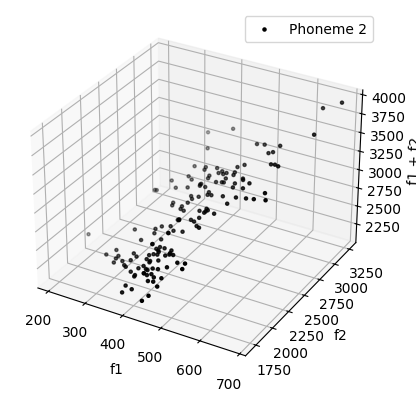

In [283]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming the functions plot_data_3D and plot_gaussians are defined somewhere in the code

# Assuming f1, f2, phoneme_id, and X_full are predefined or provided

X = np.zeros((len(f1), 3))
# Write code to populate the feature matrix X with f1, f2, and f1+f2
X[:, 0] = f1
X[:, 1] = f2
X[:, 2] = f1 + f2
X = X.astype(np.float32)

# Filter X to contain only samples that belong to the chosen phoneme (p_id)
X_phoneme = X[phoneme_id == p_id]

fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
# Assuming plot_data_3D is a function to plot 3D data points
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X.shape
k = 6  # Number of GMM components
p = np.ones((k)) / k
random_indices = np.random.choice(N, size=k, replace=False)
mu = X[random_indices, :]  # Initial means, shape kxD
s = np.zeros((k, D, D))  # Initial covariances, shape kxDxD
n_iter = 150

# Initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i, :, :] = cov_matrix / k

Z = np.zeros((N, k))  # Shape Nxk for responsibilities

# Run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t + 1, n_iter))

    # E-step
    Z = get_predictions(mu, s, p, X)
    Z_norm = Z / np.sum(np.abs(Z), axis=1)[:, None]

    # M-step
    for i in range(k):
        mu[i, :] = np.matmul(X.transpose(), Z[:, i]) / np.sum(Z[:, i])

        # Calculate covariances with full matrices
        mu_i = mu[i, :]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:, i], axis=1), D, axis=1) * term_1.transpose()
        s[i, :, :] = np.matmul(term_1, term_2) / np.sum(Z[:, i])
        p[i] = np.mean(Z[:, i])

# Assuming plot_gaussians is a function to plot the fitted Gaussians
plot_gaussians(ax1, 2 * s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()


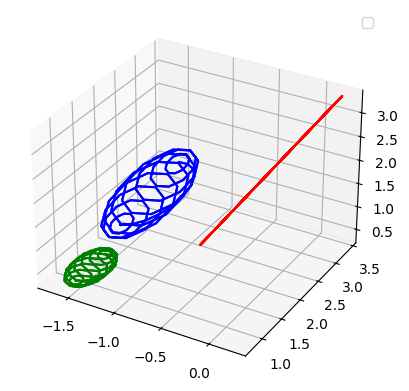

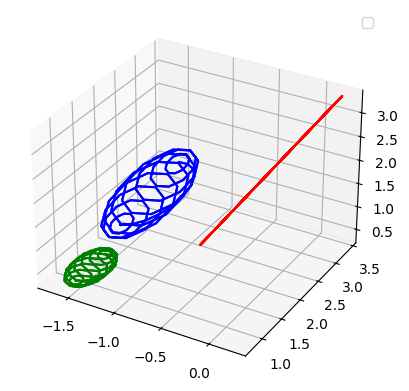

In [286]:
def get_better_predictions(mu, s, p, X, reg_term=1e-6):
                  
    k = s.shape[0]  # Number of GMM components
    N = X.shape[0]  # Number of data samples
    D = X.shape[1]  # Dimensionality of the dataset

    Z = np.zeros((N, k))
    for i in range(k):
        mu_i = mu[i, :]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        X_minus_mu = X - mu_i_repeated.transpose()

        # Regularized by adding a positive number to the diagonal elements
        inverse_s = scipy.linalg.pinv(s[i] + np.eye(D) * reg_term)
        inverse_s = np.squeeze(inverse_s)

        s_i_det = np.linalg.det(s[i] + np.eye(D) * reg_term)
        

        # Log-probability calculations to avoid numerical issues
        x_s_x = np.matmul(X_minus_mu, inverse_s) * X_minus_mu
        Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))

    return Z

#########################################
# Write your code here
p_id = 1# id of the phoneme that will be used (e.g. 1, or 2)

k = 3# number of GMM components

f1_mean, f1_std = f1.mean(), f1.std()
f2_mean, f2_std = f2.mean(), f2.std()
f3_mean, f3_std = (f1 + f2).mean(), (f1 + f2).std()
# print(f1_mean, f2_mean, f3_mean)
f1_normalized = (f1 - f1_mean) / f1_std
f2_normalized = (f2 - f2_mean) / f2_std
f3_normalized = (f1 + f2 - f3_mean) / f3_std

X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

# use normalized data
X[:, 0] = f1_normalized
X[:, 1] = f2_normalized
X[:, 2] = f3_normalized

# Filter X to, contain only samples that belong to the chosen phoneme.
X = X[phoneme_id == p_id, :]

#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150
# np.random.seed(seed_value)

# seed_value = 30  # Replace with your desired seed value
# np.random.seed(seed_value)
# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_better_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()